# Railway Track Fault Detection
---
|Subject:|Mathematical Modeling Practice|
|---|---|
|Semester:|Fall 2022|
|Name:|Tamás Demus|
|NEPTUN:|XP4B9D|


## Dataset
---
|Name:|Railway Track Fault Detection|
|---|---|
|Link to dataset:|https://www.kaggle.com/datasets/salmaneunus/railway-track-fault-detection|


## System setup
---

##### Importing modules

In [34]:
import os
import gc

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

plt.rcParams.update({'font.size': 16})

import cv2 as cv

from tensorflow.keras.layers import Rescaling, Conv2D, MaxPooling2D, BatchNormalization, Dropout, Flatten, Dense
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.data import AUTOTUNE
from tensorflow.nn import softmax

from sklearn.metrics import ConfusionMatrixDisplay, RocCurveDisplay

from tqdm import tqdm, trange



##### Setting up environment

In [14]:
raw_folder = './raw/'
data_folder = './data/'
preprocessed_folder = './preprocessed/'
augmented_folder = './augmented/'

plot_folder = './plots/'

if not os.path.exists(plot_folder):
    os.makedirs(plot_folder)

PATH = [
    'Train/Non defective/',
    'Train/Defective/',
    'Validation/Non defective/',
    'Validation/Defective/',
    'Test/Non defective/',
    'Test/Defective/',
]

RAW_PATH = [os.path.join(raw_folder, p) for p in PATH]
DATA_PATH = [os.path.join(data_folder, p) for p in PATH]
PREPROCESSED_PATH = [os.path.join(preprocessed_folder, p) for p in PATH]
AUGMENTED_PATH = [os.path.join(augmented_folder, p) for p in PATH[:2]]

for p in DATA_PATH:
    if not os.path.exists(p):
        os.makedirs(p)
        
for p in PREPROCESSED_PATH:
    if not os.path.exists(p):
        os.makedirs(p)
        
for p in AUGMENTED_PATH:
    if not os.path.exists(p):
        os.makedirs(p)

## Raw data
---

##### File types

In [4]:
ext = []

for p in RAW_PATH:
    for f in os.listdir(p):
        ext.append(os.path.splitext(f)[-1])
    
print(set(ext))

{'.jpeg', '.jpg', '.webp'}


Copy raw dataset with new filenames and converting the extensions

In [5]:
i = 0
p_new = 0
for p in RAW_PATH:
    for f in tqdm(os.listdir(p), desc=p):
        dst = os.path.join(DATA_PATH[p_new], str(i)+'.jpg')
        if not os.path.exists(dst):
            src = os.path.join(p, f)
            img = cv.imread(src)
            cv.imwrite(dst, img)
        i += 1
    p_new += 1


./raw/Test/Defective/: 100%|██████████| 11/11 [00:00<00:00, 10717.15it/s]


## Clean data
---

##### Create image dataframe

In [15]:
images = pd.DataFrame({
    'type': pd.Series(dtype='str'),
    'defect': pd.Series(dtype='int'),
    'defect_str': pd.Series(dtype='str'),
    'path': pd.Series(dtype='str'),
    'filename': pd.Series(dtype='str'),
    'img': pd.Series(dtype='str'),
    'height': pd.Series(dtype='int'),
    'width': pd.Series(dtype='int'),
    'components': pd.Series(dtype='int'),
    'R_mean': pd.Series(dtype='float'),
    'G_mean': pd.Series(dtype='float'),
    'B_mean': pd.Series(dtype='float')
})

for each in DATA_PATH:
    p = each.split('/')
    if p[3] == 'Defective':
        y = 1
    else:
        y = 0
    for img in os.listdir(each):
        data = {
            'type': p[2].lower(),
            'defect': y,
            'defect_str': p[3],
            'path': each,
            'filename': img,
            'img': os.path.join(each, img),
            'height': 0,
            'width': 0,
            'components': 0,
            'R_mean': 0,
            'G_mean': 0,
            'B_mean': 0
        }
        df = pd.DataFrame(data=data, index=[1])
        images = pd.concat([images, df])

images.reset_index(inplace=True, drop=True)
display(images)
images.info()

,type,defect,defect_str,path,filename,img,height,width,components,R_mean,G_mean,B_mean
0,train,0,Non defective,./data/Train/Non defective/,97.jpg,./data/Train/Non defective/97.jpg,0,0,0,0.0,0.0,0.0
1,train,0,Non defective,./data/Train/Non defective/,79.jpg,./data/Train/Non defective/79.jpg,0,0,0,0.0,0.0,0.0
2,train,0,Non defective,./data/Train/Non defective/,114.jpg,./data/Train/Non defective/114.jpg,0,0,0,0.0,0.0,0.0
3,train,0,Non defective,./data/Train/Non defective/,18.jpg,./data/Train/Non defective/18.jpg,0,0,0,0.0,0.0,0.0
4,train,0,Non defective,./data/Train/Non defective/,46.jpg,./data/Train/Non defective/46.jpg,0,0,0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
379,test,1,Defective,./data/Test/Defective/,381.jpg,./data/Test/Defective/381.jpg,0,0,0,0.0,0.0,0.0
380,test,1,Defective,./data/Test/Defective/,379.jpg,./data/Test/Defective/379.jpg,0,0,0,0.0,0.0,0.0
381,test,1,Defective,./data/Test/Defective/,377.jpg,./data/Test/Defective/377.jpg,0,0,0,0.0,0.0,0.0
382,test,1,Defective,./data/Test/Defective/,380.jpg,./data/Test/Defective/380.jpg,0,0,0,0.0,0.0,0.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 384 entries, 0 to 383
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   type        384 non-null    object 
 1   defect      384 non-null    int64  
 2   defect_str  384 non-null    object 
 3   path        384 non-null    object 
 4   filename    384 non-null    object 
 5   img         384 non-null    object 
 6   height      384 non-null    int64  
 7   width       384 non-null    int64  
 8   components  384 non-null    int64  
 9   R_mean      384 non-null    float64
 10  G_mean      384 non-null    float64
 11  B_mean      384 non-null    float64
dtypes: float64(3), int64(4), object(5)
memory usage: 36.1+ KB


##### Generate random sample from training data

In [183]:
N_samples = 4
random_sample_idx = []
idx1 = np.random.choice(images[(images.type == 'train') & (images.defect == 0)].index, N_samples)
idx2 = np.random.choice(images[(images.type == 'train') & (images.defect == 1)].index, N_samples)
random_sample_idx = np.concatenate([idx1, idx2])
random_sample = images.iloc[random_sample_idx].copy()
random_sample

,type,defect,defect_str,path,filename,img,height,width,components,R_mean,G_mean,B_mean
0,train,0,Non defective,./data/Train/Non defective/,97.jpg,./data/Train/Non defective/97.jpg,0,0,0,0.0,0.0,0.0
90,train,0,Non defective,./data/Train/Non defective/,33.jpg,./data/Train/Non defective/33.jpg,0,0,0,0.0,0.0,0.0
117,train,0,Non defective,./data/Train/Non defective/,138.jpg,./data/Train/Non defective/138.jpg,0,0,0,0.0,0.0,0.0
60,train,0,Non defective,./data/Train/Non defective/,50.jpg,./data/Train/Non defective/50.jpg,0,0,0,0.0,0.0,0.0
244,train,1,Defective,./data/Train/Defective/,208.jpg,./data/Train/Defective/208.jpg,0,0,0,0.0,0.0,0.0
297,train,1,Defective,./data/Train/Defective/,275.jpg,./data/Train/Defective/275.jpg,0,0,0,0.0,0.0,0.0
195,train,1,Defective,./data/Train/Defective/,257.jpg,./data/Train/Defective/257.jpg,0,0,0,0.0,0.0,0.0
214,train,1,Defective,./data/Train/Defective/,194.jpg,./data/Train/Defective/194.jpg,0,0,0,0.0,0.0,0.0


##### Visualize random sample

100%|██████████| 8/8 [00:01<00:00,  7.09it/s]


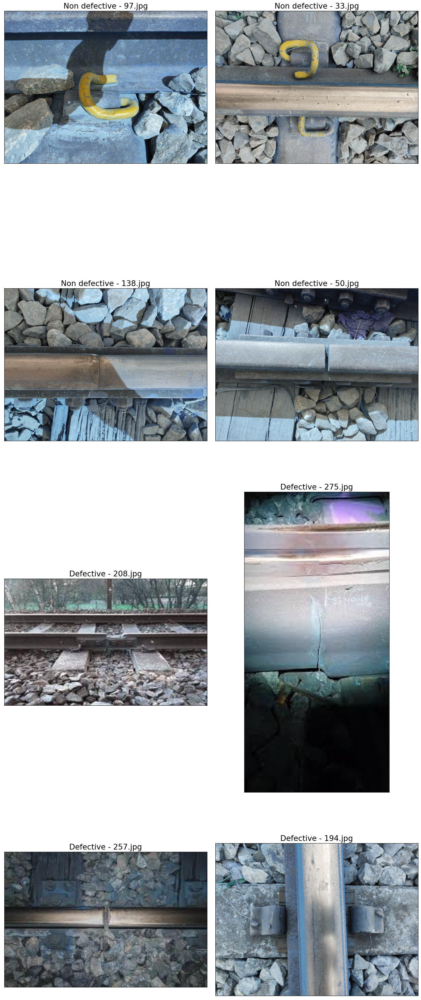

In [184]:
fig, ax = plt.subplots(N_samples, 2, figsize=(15, 10*N_samples), tight_layout=True)
ax = ax.flatten()

for i, idx in enumerate(tqdm(random_sample.index)):
    image = cv.imread(images.img[idx])
    ax[i].imshow(image)
    ax[i].set_xticks(ticks=[])
    ax[i].set_yticks(ticks=[])
    ax[i].set_title(images.defect_str[idx] + ' - ' +  images.filename[idx])

plt.show()

## Data exploration
---

##### Extract basic features from the images

In [6]:
height = []
width = []
components = []
R_mean = []
G_mean = []
B_mean = []

for i in tqdm(images.index):
    image = cv.imread(images.iloc[i].img)
    height.append(image.shape[0])
    width.append(image.shape[1])
    components.append(image.shape[2])
    R_mean.append(np.mean(image[:,:,0]))
    G_mean.append(np.mean(image[:,:,1]))
    B_mean.append(np.mean(image[:,:,2]))

images.update({'height': height})
images.update({'width': width})
images.update({'components': components})
images.update({'R_mean': R_mean})
images.update({'G_mean': G_mean})
images.update({'B_mean': B_mean})

100%|██████████| 384/384 [01:14<00:00,  5.17it/s]


##### Shape of the images

Minimum  height  :  148  @  243
Maximum  height  :  8000  @  241
Minimum  width  :  156  @  297
Maximum  width  :  8000  @  152
Minimum  components  :  3  @  0
Maximum  components  :  3  @  0
Minimum sizes:
height    322
width     156
Name: 297, dtype: int64
height    148
width     194
Name: 243, dtype: int64


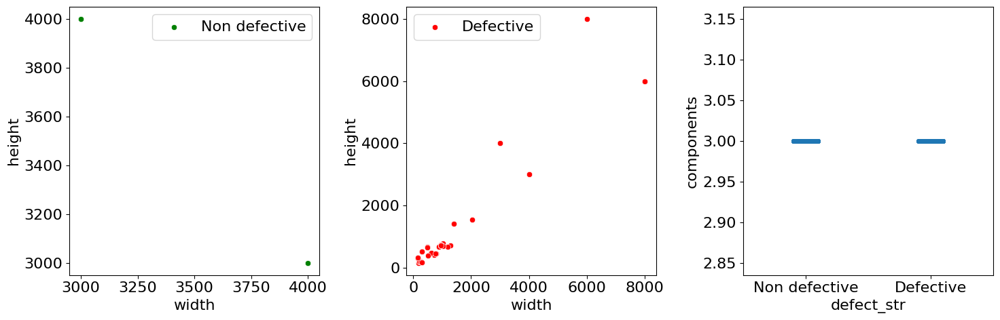

In [11]:
dims = ['height', 'width', 'components']
for dim in dims:
    print('Minimum ', dim, ' : ', images[dim].min(), ' @ ', images[dim].argmin())
    print('Maximum ', dim, ' : ', images[dim].max(), ' @ ', images[dim].argmax())

min_height = np.argmin(images.height)
min_width = np.argmin(images.width)
print('Minimum sizes:')
print(images[['height', 'width']].iloc[min_width])
print(images[['height', 'width']].iloc[min_height])

fig, ax = plt.subplots(1, 3, figsize=(15, 5), tight_layout=True)
sns.scatterplot(x='width', y='height', data=images[images.defect == 0], ax=ax[0], label='Non defective', color='green')
sns.scatterplot(x='width', y='height', data=images[images.defect == 1], ax=ax[1], label='Defective', color='red')
sns.stripplot(x='defect_str', y='components', data=images, ax=ax[2])
plt.show()
plt.savefig(os.path.join(plot_folder, 'shapes.png'))

##### Main component distribution of the images

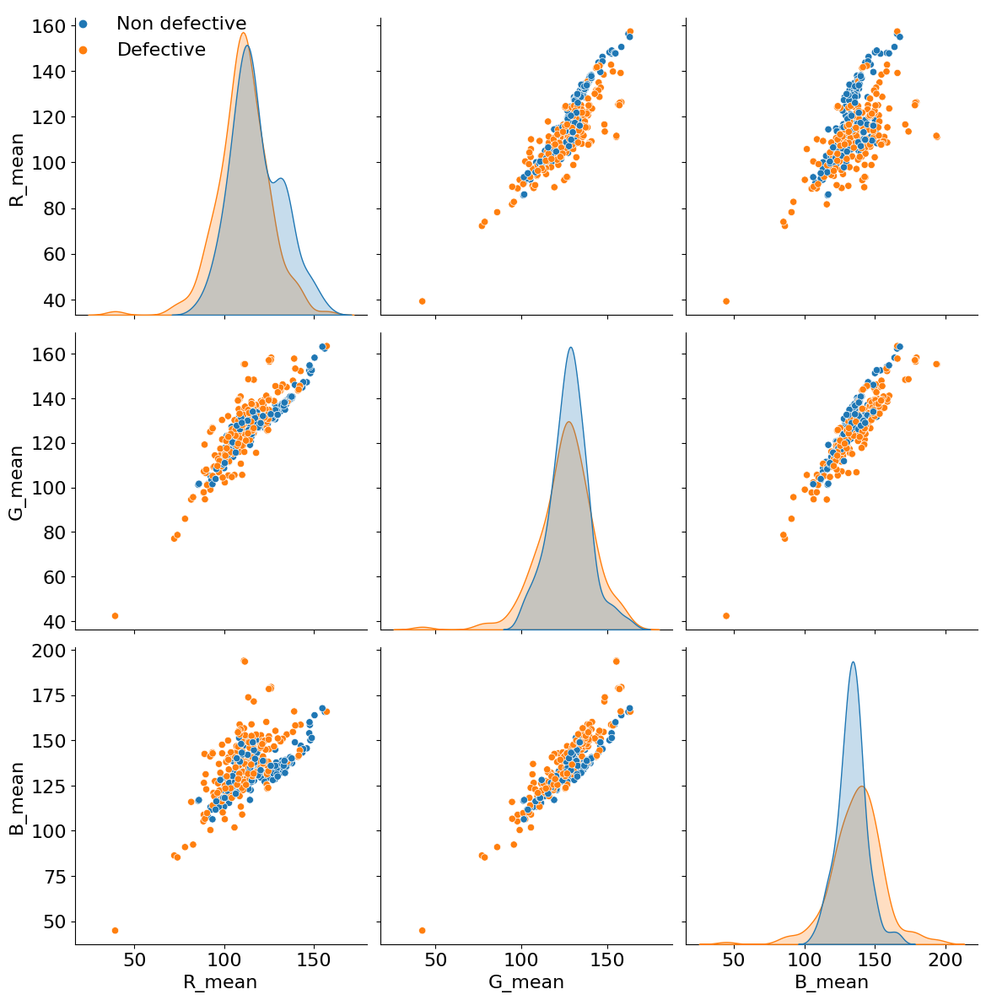

In [35]:
cols = ['R_mean', 'G_mean', 'B_mean']
plot = sns.pairplot(data=images, vars=cols, hue='defect_str', height=4)
sns.move_legend(plot, loc='upper left', bbox_to_anchor=(0.05, 1.0), title=None)
plt.savefig(os.path.join(plot_folder, 'comp_pair.png'))
plt.show()

##### Dataset balance

In [9]:
images.groupby(['type', 'defect_str']).count()

defect  path  filename  img  height  width  \
type       defect_str                                                  
test       Defective          11    11        11   11      11     11   
           Non defective      11    11        11   11      11     11   
train      Defective         150   150       150  150     150    150   
           Non defective     150   150       150  150     150    150   
validation Defective          31    31        31   31      31     31   
           Non defective      31    31        31   31      31     31   

                          components  R_mean  G_mean  B_mean  
type       defect_str                                         
test       Defective              11      11      11      11  
           Non defective          11      11      11      11  
train      Defective             150     150     150     150  
           Non defective         150     150     150     150  
validation Defective              31      31      31      31  
           Non defective          31      31      31      31

##### Basic information on random sample: color components on RGB and HSV

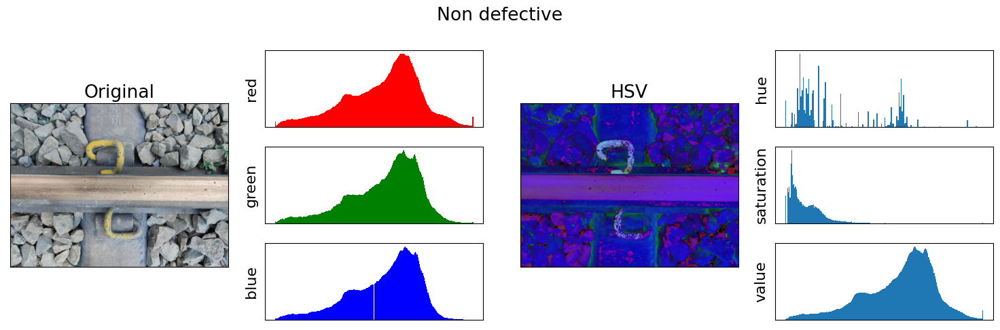

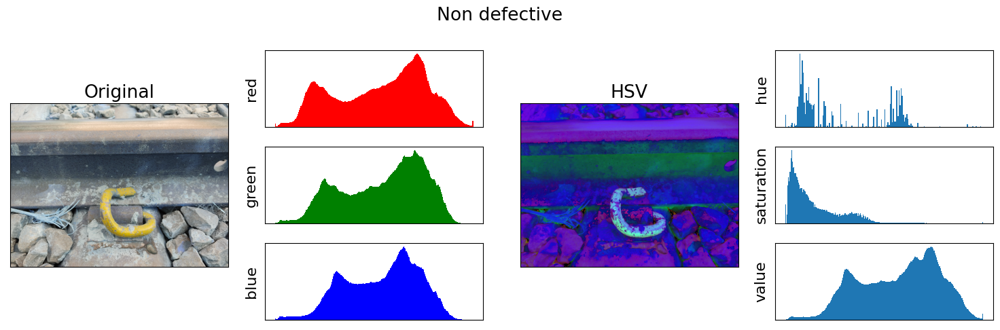

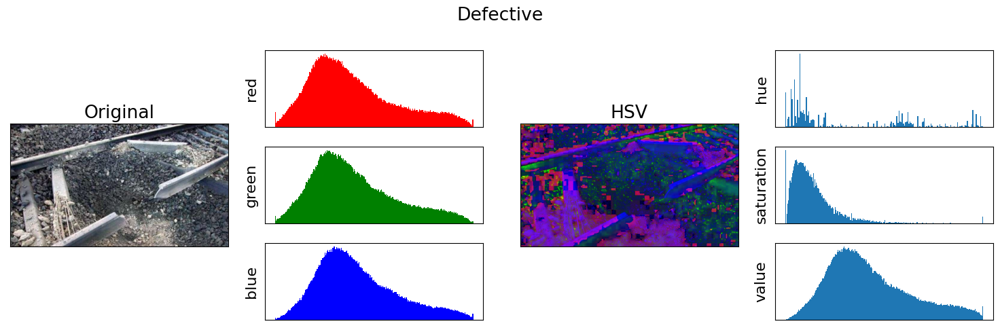

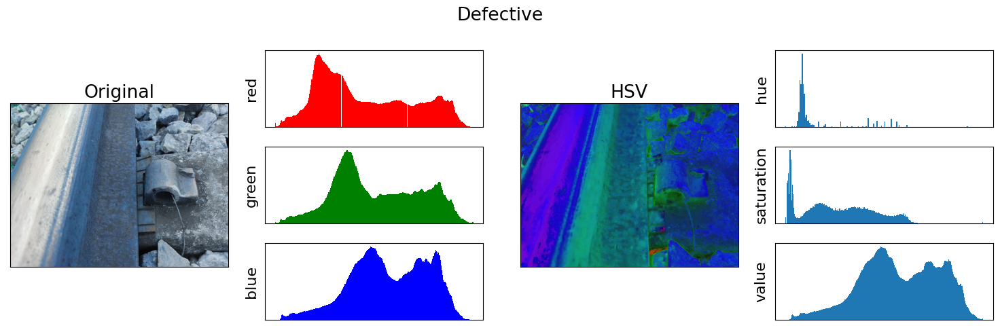

In [56]:
gs = gridspec.GridSpec(3, 4)

for s, sample in enumerate(random_sample[['img', 'defect_str']].itertuples()):
    fig = plt.figure(figsize=(15, 5), tight_layout=True)
    fig.suptitle(sample.defect_str)
    ax = [
        fig.add_subplot(gs[:, 0]),
        fig.add_subplot(gs[0, 1]),
        fig.add_subplot(gs[1, 1]),
        fig.add_subplot(gs[2, 1]),
        fig.add_subplot(gs[:, 2]),
        fig.add_subplot(gs[0, 3]),
        fig.add_subplot(gs[1, 3]),
        fig.add_subplot(gs[2, 3]),
    ]
    image = cv.imread(sample.img)
    ax[0].imshow(image)
    ax[0].set_title('Original')
    ax[0].set_xticks(ticks=[])
    ax[0].set_yticks(ticks=[])
    
    for c, component in enumerate(['red', 'green', 'blue']):
        ax[c+1].hist(image[:, :, c].ravel(), bins=256, color=component)
        ax[c+1].set_ylabel(component)
        ax[c+1].set_xticks(ticks=[])
        ax[c+1].set_yticks(ticks=[])
        
    hsv = cv.cvtColor(image, cv.COLOR_BGR2HSV)
    ax[4].imshow(hsv)
    ax[4].set_title('HSV')
    ax[4].set_xticks(ticks=[])
    ax[4].set_yticks(ticks=[])
    
    for c, component in enumerate(['hue', 'saturation', 'value']):
        bins = [180, 256, 256]
        ax[c+5].hist(hsv[:, :, c].ravel(), bins=bins[c])
        ax[c+5].set_ylabel(component)
        ax[c+5].set_xticks(ticks=[])
        ax[c+5].set_yticks(ticks=[])
    
    filename = 'comp_analysis_' + str(s) + '.png'
    plt.savefig(os.path.join(plot_folder, filename))
    plt.show()

## Toolkit
---

##### Base class

In [9]:
class BaseClass:
    @staticmethod
    def __del__():
        gc.collect()  
        
    @staticmethod
    def remove_old_data(folder):
        for root, _, files in os.walk(folder, topdown=False):
            for name in files:
                os.remove(os.path.join(root, name))

Class for image processing

In [177]:
class ImageProcessor(BaseClass):
    def __init__(self, steps, kwargs, plot_kwargs={}):
        self.df = None
        self.steps = steps
        self.kwargs = kwargs
        self.plot_kwargs = plot_kwargs
        self.defect_class = None
        self.img_path = None
        self.imgs = []
        self.lines = []
        self.kp = []
        self.des = []
        self.function = {
            'original': self.load_sample,
            'crop': self.crop,
            'resize': self.resize,
            'grayscale': self.grayscale,
            'binary': self.binary,
            'hist_eq': self.hist_eq,
            'noise_filt': self.noise_filt,
            'stretching': self.stretching,
            'Laplacian': self.Laplacian,
            'Canny': self.Canny,
            'Hough': self.Hough,
            'feat_detect': self.feat_detect,
            'show': self.show,
            'save': self.save_image
        }
    
    def load_sample(self, df_entry):
        del self.imgs
        del self.lines
        del self.kp
        del self.des
        gc.collect()
        self.imgs = []
        self.lines = []
        self.kp = []
        self.des = []
        self.imgs.append(cv.imread(df_entry.img))
        self.defect_class = df_entry.defect_str
        self.img_path = df_entry.img

    def crop(self):
        ratio = self.kwargs.get('crop').get('ratio')
        h, w = self.imgs[-1].shape[:2]
        pad_h = int(ratio * h)
        pad_w = int(ratio * w)
        self.imgs.append(
            self.imgs[-1][pad_h:-pad_h, pad_w:-pad_w, :]
        )
    
    def resize(self):
        h, w = self.imgs[-1].shape[:2]
        new_h = self.kwargs.get('resize').get('height')
        new_w = self.kwargs.get('resize').get('width')
        if w < h:
            nh = int(w/h * new_h)
            nw = new_w
            self.imgs.append(
                cv.resize(self.imgs[-1], (nh, nw), interpolation=cv.INTER_AREA)
            )
            pad = int((nh - new_h) / 2)
            if pad > 0:
                self.imgs[-1] = self.imgs[-1][:, pad:-pad]
        else:
            nh = new_h
            nw = int(h/w * new_w)
            self.imgs.append(
                cv.resize(self.imgs[-1], (nh, nw), interpolation=cv.INTER_AREA)
            )
            pad = int((nw - new_w) / 2)
            if pad > 0:
                self.imgs[-1] = self.imgs[-1][pad:-pad, :]

    def grayscale(self):
        self.imgs.append(
            cv.cvtColor(self.imgs[-1], cv.COLOR_BGR2GRAY)
        )
    
    def binary(self):
        self.imgs.append(
            cv.threshold(self.imgs[-1], 127, 255, cv.THRESH_BINARY)[1]
        )
        
    def hist_eq(self):
        self.imgs.append(
            cv.equalizeHist(self.imgs[-1])
        )
        
    def noise_filt(self):
        filt_type = self.kwargs.get('noise_filt').get('type')
        filt_size = self.kwargs.get('noise_filt').get('size')
        if filt_type == 'Gaussian':
            self.imgs.append(
                cv.GaussianBlur(self.imgs[-1], filt_size, 0)
            )
        elif filt_type == 'median':
            self.imgs.append(
                cv.medianBlur(self.imgs[-1], filt_size)
            )
        else:
            self.imgs.append(self.imgas[-1])
        
    def stretching(self):
        self.imgs.append(
            cv.normalize(self.imgs[-1], None, 0, 1)
        )
        
    def Laplacian(self):
        size = self.kwargs.get('Laplacian').get('size')
        self.imgs.append(
            cv.Laplacian(self.imgs[-1], ddepth=cv.CV_64F, ksize=size)
        )
    
    def Canny(self):
        low = self.kwargs.get('Canny').get('low')
        high = self.kwargs.get('Canny').get('high')
        self.imgs.append(
            cv.Canny(self.imgs[-1], low, high)
        )
        
    def Hough(self):
        minLL = self.kwargs.get('Hough').get('minLineLength')
        maxLG = self.kwargs.get('Hough').get('maxLineGap')
        self.imgs.append(
            self.imgs[-1]
        )
        self.lines = cv.HoughLinesP(self.imgs[-1], 1, np.pi/180, 10, minLineLength=minLL, maxLineGap=maxLG)
        d = []
        for line in self.lines:
            x1, y1, x2, y2 = line[0]
            d.append((x1-x2)**2 + (y1-y2)**2)
        self.lines = [x for _, x in sorted(zip(d, self.lines), key=lambda pair: pair[0], reverse=True)]
        
    def feat_detect(self):
        detector_type = self.kwargs.get('feat_detect').get('type')
        if detector_type == 'ORB':
            detector = cv.ORB_create()
        elif detector_type == 'SIFT':
            detector = cv.sift_create()
        else:
            self.imgs.append(self.imgs[-1])
            print('Feature detector type not yet implemented!')
            return
        kp = detector.detect(self.imgs[-1], None)
        self.imgs.append(
            cv.drawKeypoints(self.imgs[-1], kp, None, color=(0, 255, 0), flags=0)
        )
        
    def save_image(self):
        path = self.img_path.split('/')
        path[1] = preprocessed_folder
        dst = os.path.join(*path[1:])
        cv.imwrite(dst, self.imgs[-1])
        
    def process_images(self, df_images):
        self.df = df_images
        for df_entry in self.df.itertuples():
            self.load_sample(df_entry)
            self.defect_class = df_entry.defect_str
            for step in self.steps[1:]:
                self.function.get(step)()
        
    def show(self):
        _, ax = plt.subplots(1, len(self.imgs), figsize=(15, 5), tight_layout=True)
        for i, img in enumerate(self.imgs):
            plot_kw = self.plot_kwargs.get(self.steps[i])
            if plot_kw:
                ax[i].imshow(img, **plot_kw)
            else:
                ax[i].imshow(img)
            ax[i].set_xticks(ticks=[])
            ax[i].set_yticks(ticks=[])
            ax[i].set_title(self.steps[i])
            if self.steps[i] == 'Hough':
                max_lines = self.kwargs.get('Hough').get('maxLines')
                for line in self.lines[:max_lines]:
                    x1, y1, x2, y2 = line[0]
                    x = np.linspace(x1, x2, 100, endpoint=True)
                    y = np.linspace(y1, y2, 100, endpoint=True)
                    ax[i].plot(x, y, c='green')
        ax[0].set_ylabel(self.defect_class)
        plt.show()

Class for data augmentation

In [11]:
class Augmenter(BaseClass):
    def __init__(self, N, df_images):
        self.N = N
        self.images = df_images[df_images.type == 'train']
        self.augmented_images = pd.DataFrame({
            'type': pd.Series(dtype='str'),
            'defect': pd.Series(dtype='int'),
            'defect_str': pd.Series(dtype='str'),
            'path': pd.Series(dtype='str'),
            'filename': pd.Series(dtype='str'),
            'img': pd.Series(dtype='str'),
            'height': pd.Series(dtype='int'),
            'width': pd.Series(dtype='int'),
            'components': pd.Series(dtype='int'),
            'R_mean': pd.Series(dtype='float'),
            'G_mean': pd.Series(dtype='float'),
            'B_mean': pd.Series(dtype='float')
        })
        self.augment_functions = [self.flip, self.random_rotate, self.random_zoom, self.random_crop]

    @staticmethod        
    def flip(img):
        img = cv.flip(img, 1)
        return img
    
    @staticmethod
    def random_rotate(img, max_angle=90):
        angle = np.random.uniform(low=-max_angle, high=max_angle)
        h, w = img.shape[:2]
        rotation_matrix = cv.getRotationMatrix2D((h/2.0, w/2.0), angle=angle, scale=1)
        img = cv.warpAffine(img, rotation_matrix, (w, h))
        return img
    
    @staticmethod
    def random_zoom(img, min_factor=0.8, max_factor=1.2):
        zoom_factor = np.random.uniform(low=min_factor, high=max_factor)
        img = cv.resize(img, None, fx=zoom_factor, fy=zoom_factor)
        return img
    
    @staticmethod
    def random_crop(img, max_ratio=0.1):
        pad1 = int(np.random.uniform(low=0, high=max_ratio) * img.shape[0])
        pad2 = int(np.random.uniform(low=0, high=max_ratio) * img.shape[0])
        pad3 = int(np.random.uniform(low=0, high=max_ratio) * img.shape[1])
        pad4 = int(np.random.uniform(low=0, high=max_ratio) * img.shape[1])
        img = img[pad1:, :, :]
        img = img[:-pad2, :, :]
        img = img[:, pad3:, :]
        img = img[:, :-pad4, :]
        return img
    
    def select_random_images(self, class_type):
        img_path_list = np.random.choice(self.images.img[images.defect == class_type], self.N, replace=False)
        return img_path_list
    
    def apply_random_function(self, img):
        rand_func = np.random.choice(self.augment_functions)
        img = rand_func(img)
        return img
    
    @staticmethod
    def save_image(img, img_path):
        img_path = img_path.split('/')
        img_path[1] = augmented_folder
        path = os.path.join(*img_path[1:-1])
        filename = img_path[-1].split('.')
        filename = ''.join([filename[0], '_augmented.', filename[1]])
        img_path = os.path.join(path, filename)
        cv.imwrite(img_path, img)
        del img
        return img_path
    
    def update_df(self, img, img_path):
        img_path = img_path.split('/')
        t = img_path[2].lower()
        defect_str = img_path[3]
        path = os.path.join(*img_path[:-1])
        filename = img_path[-1]
        img_path = os.path.join(path, filename)
        data = {
            'type': t,
            'defect': y,
            'defect_str': defect_str,
            'path': path,
            'filename': filename,
            'img': img_path,
            'height': img.shape[0],
            'width': img.shape[1],
            'components': img.shape[2],
            'R_mean': np.mean(img[:,:,0]),
            'G_mean': np.mean(img[:,:,1]),
            'B_mean': np.mean(img[:,:,2])
        }
        df = pd.DataFrame(data=data, index=[1])
        self.augmented_images = pd.concat([self.augmented_images, df])
        self.augmented_images.reset_index(inplace=True, drop=True)
            
    def augment_images(self):
        for cl in set(self.images.defect):
            img_path_list = self.select_random_images(cl)
            for img_path in img_path_list:
                img = cv.imread(img_path)
                img = self.apply_random_function(img)
                img_path_new = self.save_image(img, img_path)
                self.update_df(img, img_path_new)
                
    def save_dataframe(self):
        return self.augmented_images

Class for Neural Network Model

In [12]:
class Model(BaseClass):
    def __init__(self, img_height, img_width):
        self.height = img_height
        self.width = img_width
        self.model = None
        self.data = {}
        self.class_names = None
        self.history = None
        self.predictions = None
        self.score = None
        self.y_pred = None
        self.y_true = None
        self.epochs = 10
        self.batch_size = 32

    def setup_neural_net(self):   
        datasets = ['Train', 'Validation', 'Test']        
        for dataset in datasets:
            self.data.update({
                dataset: image_dataset_from_directory(
                    os.path.join(preprocessed_folder, dataset),
                    labels='inferred',
                    label_mode='binary',
                    image_size=(self.height, self.width), 
                    color_mode='grayscale',
                    batch_size=self.batch_size
                )
            })
        self.class_names = self.data['Train'].class_names
            
        self.model.compile(
            optimizer='adam',
            loss='binary_crossentropy',
            metrics=['accuracy']
        )

        train_ds = self.data['Train'].cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
        val_ds = self.data['Validation'].cache().prefetch(buffer_size=AUTOTUNE)

    def train_net(self):
        self.history = self.model.fit(
            self.data['Train'],
            validation_data=self.data['Validation'],
            epochs=self.epochs
        )
        
    def predict_test(self):
        self.predictions = self.model.predict(self.data['Test'])
        self.y_pred = (1*(self.predictions > 0.5)).ravel()
        self.y_true = np.array(list(self.data['Test'].take(-1))[-1][-1]).ravel().astype(int)
        print('Test values:         ', self.y_true)
        print('Predicted values:    ', self.y_pred)
        
    def show_metrics(self):
        fig, ax = plt.subplots(2, 2, figsize=(15, 10), tight_layout=True)
        sns.lineplot(x=np.arange(self.epochs), y='accuracy', data=self.history.history, ax=ax[0, 0], label='training')
        sns.lineplot(x=np.arange(self.epochs), y='val_accuracy', data=self.history.history, ax=ax[0, 0], label='validation')
        sns.lineplot(x=np.arange(self.epochs), y='loss', data=self.history.history, ax=ax[0, 1], label='training')
        sns.lineplot(x=np.arange(self.epochs), y='val_loss', data=self.history.history, ax=ax[0, 1], label='validation')
        ConfusionMatrixDisplay.from_predictions(self.y_true, self.y_pred, display_labels=self.class_names, ax=ax[1, 0], cmap='crest', colorbar=False)
        RocCurveDisplay.from_predictions(self.y_true, self.y_pred, ax=ax[1, 1])
        plt.show()

## Data augmentation
---

In [30]:
N_augmented = 25

image_augmenter = Augmenter(N_augmented, images)
image_augmenter.remove_old_data(augmented_folder)
image_augmenter.augment_images()
augmented_images = image_augmenter.save_dataframe()
del image_augmenter
augmented_images


,type,defect,defect_str,path,filename,img,height,width,components,R_mean,G_mean,B_mean
0,train,1,Non defective,./augmented/Train/Non defective,49_augmented.jpg,./augmented/Train/Non defective/49_augmented.jpg,3000,4000,3,133.583159,137.296786,136.550846
1,train,1,Non defective,./augmented/Train/Non defective,123_augmented.jpg,./augmented/Train/Non defective/123_augmented.jpg,4000,3000,3,78.328691,86.558065,91.659171
2,train,1,Non defective,./augmented/Train/Non defective,73_augmented.jpg,./augmented/Train/Non defective/73_augmented.jpg,3512,4682,3,120.399549,129.824643,134.610854
3,train,1,Non defective,./augmented/Train/Non defective,22_augmented.jpg,./augmented/Train/Non defective/22_augmented.jpg,2663,3748,3,122.572741,126.117962,123.505157
4,train,1,Non defective,./augmented/Train/Non defective,2_augmented.jpg,./augmented/Train/Non defective/2_augmented.jpg,3000,4000,3,112.721564,128.079839,140.955636
5,train,1,Non defective,./augmented/Train/Non defective,130_augmented.jpg,./augmented/Train/Non defective/130_augmented.jpg,3000,4000,3,74.794704,82.569316,85.744038
6,train,1,Non defective,./augmented/Train/Non defective,102_augmented.jpg,./augmented/Train/Non defective/102_augmented.jpg,3000,4000,3,102.035419,113.237711,121.276660
7,train,1,Non defective,./augmented/Train/Non defective,104_augmented.jpg,./augmented/Train/Non defective/104_augmented.jpg,3000,4000,3,81.114039,98.671966,113.782715
8,train,1,Non defective,./augmented/Train/Non defective,50_augmented.jpg,./augmented/Train/Non defective/50_augmented.jpg,3000,4000,3,104.392321,116.575223,124.396613
9,train,1,Non defective,./augmented/Train/Non defective,18_augmented.jpg,./augmented/Train/Non defective/18_augmented.jpg,3037,4050,3,112.259104,128.056878,137.417183


## Image processing
---

In [7]:
img_height = 128
img_width = 128

preprocessing_steps = [
    'original',
    'crop',
    'grayscale',
    'hist_eq',
    'noise_filt',
    'resize',
    'save'
]

preprocessing_kwargs = {
    'crop': {'ratio': 0.1},
    'resize': {
        'height': img_height,
        'width': img_width
    },
    'noise_filt': {
        'type': 'median',
        'size': 11
    },
    'Laplacian': {'size': 5},
    'Canny': {
        'low': 100,
        'high': 200
    },
    'Hough': {
        'minLineLength': 10,
        'maxLineGap': 20
    },
    'feat_detect': {
        'type': 'ORB'
    }
}

In [ ]:
image_processor = ImageProcessor(preprocessing_steps, preprocessing_kwargs)
image_processor.remove_old_data(preprocessed_folder)
image_processor.process_images(images)
image_processor.process_images(augmented_images)
del image_processor

## Model build
---

##### Construct neural network

In [9]:
CNN = Model(img_height, img_width)

CNN.epochs = 50
CNN.batch_size = 32

CNN.model = Sequential([
    Rescaling(1./255, input_shape=(img_height, img_width, 1)),
    Conv2D(32, 3, padding='same', activation='relu', kernel_initializer='he_uniform'),
    Conv2D(32, 3, padding='same', activation='relu', kernel_initializer='he_uniform'),
    BatchNormalization(),
    MaxPooling2D(),
    Dropout(0.1),
    Conv2D(64, 3, padding='same', activation='relu', kernel_initializer='he_uniform'),
    Conv2D(64, 3, padding='same', activation='relu', kernel_initializer='he_uniform'),
    BatchNormalization(),
    MaxPooling2D(),
    Dropout(0.2),
    Conv2D(64, 3, padding='same', activation='relu', kernel_initializer='he_uniform'),
    Conv2D(64, 3, padding='same', activation='relu', kernel_initializer='he_uniform'),
    BatchNormalization(),
    MaxPooling2D(),
    Dropout(0.4),
    Flatten(),
    Dense(units=int(img_height*img_width/2), activation='relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

CNN.setup_neural_net()
CNN.model.summary()

2022-12-22 00:21:12.612544: W tensorflow/tsl/framework/cpu_allocator_impl.cc:82] Allocation of 536870912 exceeds 10% of free system memory.
2022-12-22 00:21:14.714626: W tensorflow/tsl/framework/cpu_allocator_impl.cc:82] Allocation of 536870912 exceeds 10% of free system memory.


Found 350 files belonging to 2 classes.
Found 62 files belonging to 2 classes.
Found 22 files belonging to 2 classes.
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 128, 128, 1)       0         
                                                                 
 conv2d_6 (Conv2D)           (None, 128, 128, 32)      320       
                                                                 
 conv2d_7 (Conv2D)           (None, 128, 128, 32)      9248      
                                                                 
 batch_normalization_4 (Batc  (None, 128, 128, 32)     128       
 hNormalization)                                                 
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 64, 64, 32)       0         
 2D)                                                             
  

##### Train

In [10]:
CNN.train_net()

Epoch 1/50
11/11 [==============================] - 72s 6s/step - loss: 3.3875 - accuracy: 0.5886 - val_loss: 5.6062 - val_accuracy: 0.4355
Epoch 2/50
11/11 [==============================] - 79s 7s/step - loss: 1.4097 - accuracy: 0.7200 - val_loss: 5.0054 - val_accuracy: 0.4839
Epoch 3/50
11/11 [==============================] - 103s 9s/step - loss: 0.9888 - accuracy: 0.7857 - val_loss: 4.2336 - val_accuracy: 0.5000
Epoch 4/50
11/11 [==============================] - 77s 7s/step - loss: 0.5872 - accuracy: 0.8343 - val_loss: 1.0355 - val_accuracy: 0.6935
Epoch 5/50
11/11 [==============================] - 75s 7s/step - loss: 0.3848 - accuracy: 0.8629 - val_loss: 2.0710 - val_accuracy: 0.5645
Epoch 6/50
11/11 [==============================] - 87s 8s/step - loss: 0.2346 - accuracy: 0.8914 - val_loss: 6.9239 - val_accuracy: 0.5000
Epoch 7/50
11/11 [==============================] - 97s 8s/step - loss: 0.2146 - accuracy: 0.9114 - val_loss: 8.7355 - val_accuracy: 0.5000
Epoch 8/50
11/11 [=

##### Predict

In [11]:
CNN.predict_test()

1/1 [==============================] - 1s 542ms/step
Test values:          [1 1 1 1 0 0 0 1 1 1 1 0 0 0 0 0 0 1 1 0 0 1]
Predicted values:     [0 0 1 0 1 1 1 0 0 0 1 1 0 1 0 1 1 0 1 1 1 1]


##### Metrics

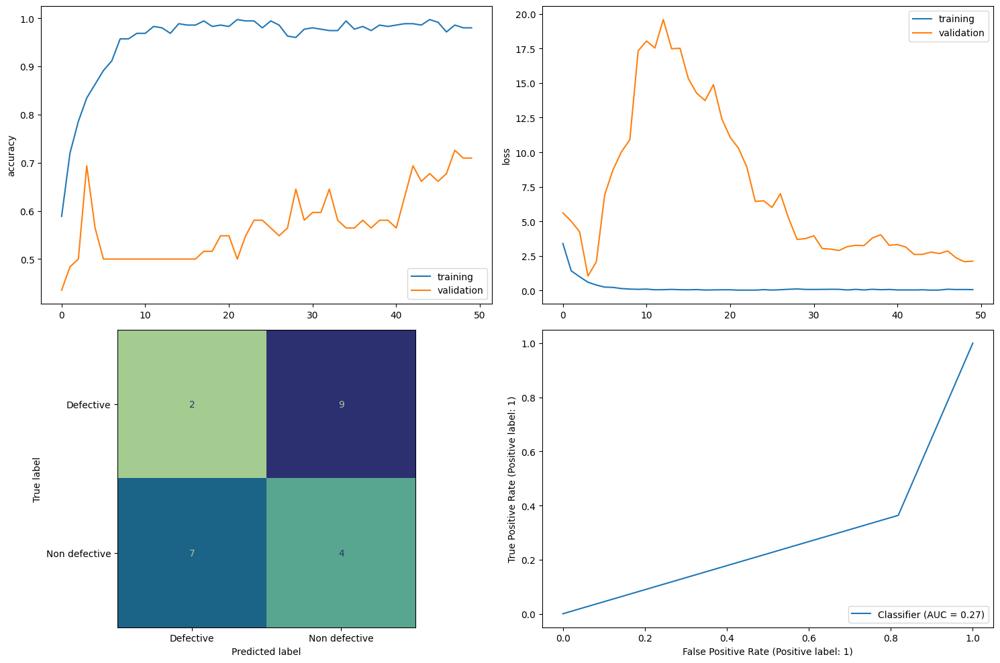

In [12]:
CNN.show_metrics()

## Playground
---

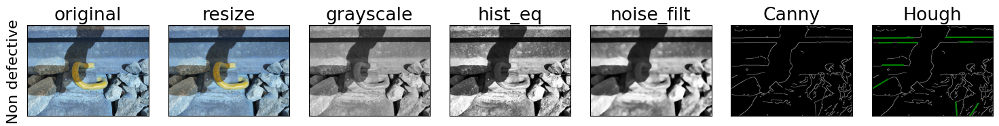

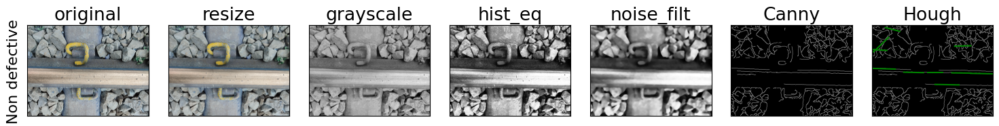

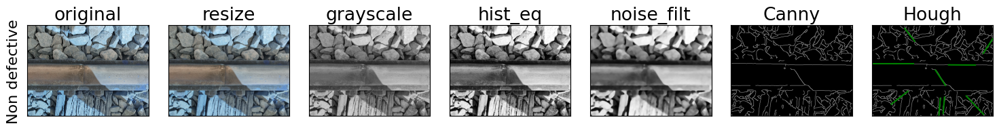

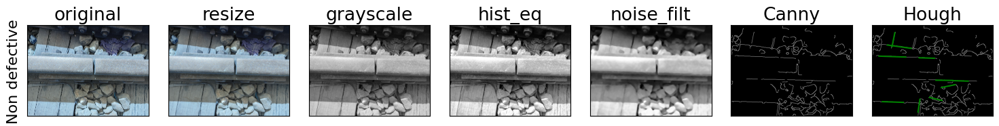

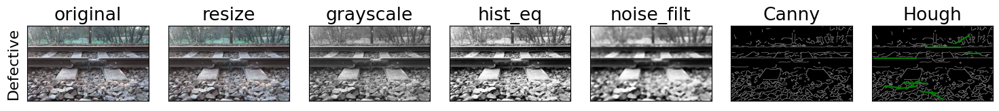

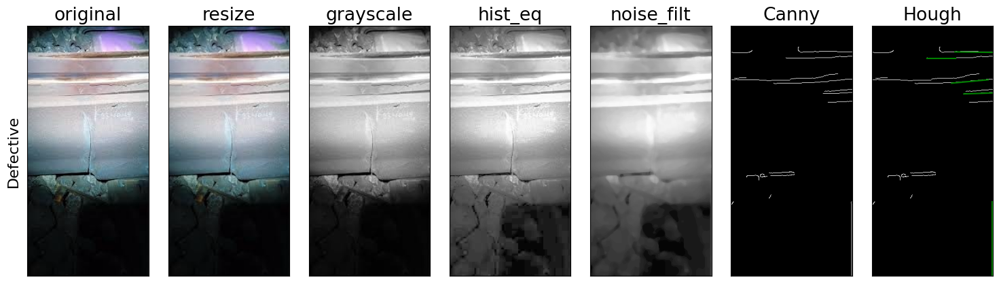

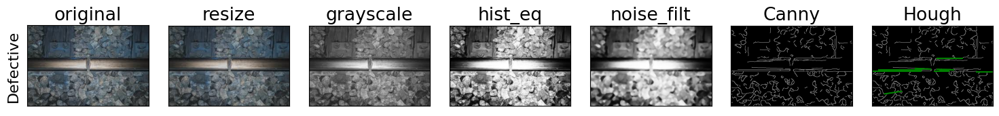

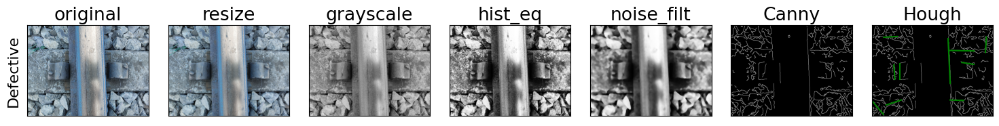

In [188]:
steps = [
    'original',
    'resize',
    'grayscale',
    'hist_eq',
    'noise_filt',
    'Canny',
    'Hough',
    'show'
]

kwargs = {
    'crop': {'ratio': 0.1},
    'resize': {
        'height': 512,
        'width': 512
    },
    'noise_filt': {
        'type': 'median',
        'size': 9
    },
    'Laplacian': {'size': 5},
    'Canny': {
        'low': 100,
        'high': 200
    },
    'Hough': {
        'minLineLength': 50,
        'maxLineGap': 10,
        'maxLines': 10
    },
    'feat_detect': {
        'type': 'ORB'
    }
}

plot_kwargs = {
    'grayscale': {'cmap': 'gray'},
    'hist_eq': {'cmap': 'gray'},
    'stretching': {'cmap': 'gray'},
    'binary': {'cmap': 'gray'},
    'noise_filt': {'cmap': 'gray'},
    'Laplacian': {'cmap': 'gray'},
    'Canny': {'cmap': 'gray'},
    'Hough': {'cmap': 'gray'},
    'feat_detect': {'cmap': 'gray'}
}

tester = ImageProcessor(steps, kwargs, plot_kwargs)
tester.process_images(random_sample)
del tester

##### Feature matching

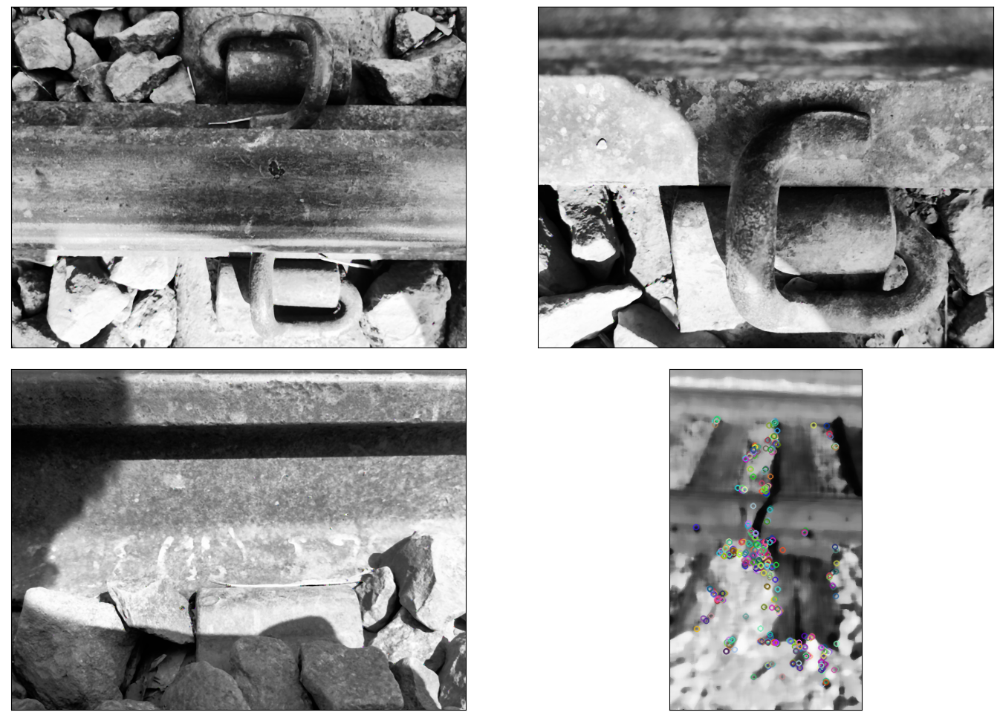

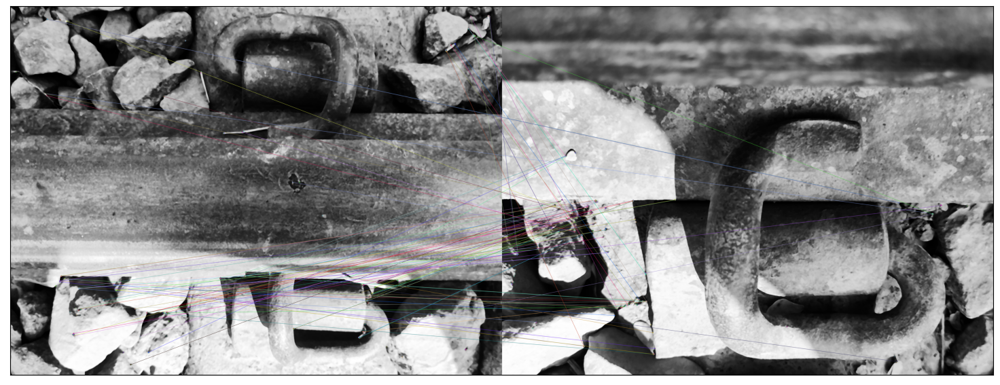

In [98]:
steps = [
    'original',
    'crop',
    'resize',
    'grayscale',
    'hist_eq',
    'noise_filt',
    'show'
]

kwargs = {
    'crop': {'ratio': 0.1},
    'resize': {
        'height': 512,
        'width': 512
    },
    'noise_filt': {
        'type': 'median',
        'size': 11
    },
    'Laplacian': {'size': 5},
    'Canny': {
        'low': 100,
        'high': 200
    },
    'feat_detect': {
        'type': 'ORB'
    }
}

plot_kwargs = {
    'grayscale': {'cmap': 'gray'},
    'hist_eq': {'cmap': 'gray'},
    'stretching': {'cmap': 'gray'},
    'binary': {'cmap': 'gray'},
    'noise_filt': {'cmap': 'gray'},
    'Laplacian': {'cmap': 'gray'}
}

img = []
orb = cv.ORB_create()
kp = []
des = []

fig, ax = plt.subplots(2, 2, figsize=(15, 10), tight_layout=True)
ax = ax.flatten()
for i in range(2*N_samples):
    img_proc = ImageProcessor(steps, kwargs, plot_kwargs)
    img_proc.load_sample(random_sample.iloc[i])
    img_proc.crop()
    img_proc.grayscale()
    img_proc.hist_eq()
    img_proc.noise_filt()

    img.append(img_proc.imgs[-1])
    del img_proc
    kpi, desi = orb.detectAndCompute(img[i], None)
    kp.append(kpi)
    des.append(desi)
    img[i] = cv.drawKeypoints(img[i], kp[i], img[i])

    ax[i].imshow(img[i], cmap='gray')
    ax[i].set_xticks(ticks=[])
    ax[i].set_yticks(ticks=[])

plt.show()    

bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=True)
matches = bf.match(des[0], des[1])
        
img_m = cv.drawMatches(img[0], kp[0], img[1], kp[1], matches, None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

fig, ax = plt.subplots(figsize=(15, 10), tight_layout=True)
ax.set_xticks(ticks=[])
ax.set_yticks(ticks=[])
ax.imshow(img_m)
plt.show()
                       